(c) The total energy of a quantum system is represented by operator $ H $. We know that an initial quantum state $ \left| \psi \right> $ evolves over time through the action of the evolution operator $ U $, defined as

$$
U(t) = \exp[-iHt]
$$

However, it's possible to build quantum circuits that approximate the realization of $ U(t) $, being one of these methods known as Trotterization. If we can write $ H $ as

$$
H = \sum_{i=1}^{k} H_i
$$

of a number $ k $ of Hermitian operators $ H_i $ that do not necessarily commute, we can approximate $ U(t) $ via

$$
U(t) \approx \prod_{j=1}^{n} \prod_{i=1}^{k} \exp\left(-i \frac{H_i t}{n}\right)
$$

with each term in the $ j $-product called a Trotter step. The larger $ n $ is, i.e., more Trotter steps, the better the approximation of $ U $ that we get.

You must implement in PennyLane a function which applies the evolution operator related to the Hamiltonian

$$
H = \alpha X \otimes X + \beta Z \otimes Z
$$

in the state $ \left| 00 \right> $. The function must receive as parameters $ \alpha $, $ \beta $, the time $ t $, and the number of Trotter steps $ n $ in this order. It must return the probability of measuring $ \left| 00 \right> $, $ \left| 01 \right> $, $ \left| 10 \right> $, $ \left| 11 \right> $.

**Observation**: You may not use PennyLane's built-in time evolution (such as `qml.ApproxTimeEvolution`, `qml.evolve`, or `qml.QubitUnitary`). All measurements must be done in the computational base.

# Solution:

As always, we install and download the libraries to utilize:



In [ ]:
!pip install pennylane

# Problem 3:

The Hamiltonian $\hat{H}$ of the problem of the ising model is given by:

$$ \hat{H} = \alpha X \otimes X + \beta Z \otimes Z $$

Due to the fact that this Hamiltonian is time independent, the time evolution operator for a quantum state $|\psi \rangle \in \mathcal{H} = ( \mathbb{C}^2 )^{\otimes 2}$ is given by:

$$ U(t) = exp( -i t \hat{H} ) $$

If we apply the Trotterization algorithm, the unitary operator of time evolution can be aproximated as:

$$ U(t) \approx \prod \limits_{j=1}^{k} e^{-i \alpha t X \otimes X / n} e^{-i \beta t Z \otimes Z / n} $$

To being able to utilize this in pennylane it is necesary to implement the terms $e^{-i \alpha X \otimes X}$ and $e^{-i \beta Z \otimes Z}$ in Pennylane. To do this, we can construct it with the built in functions, or utilize the power of operators algebra to construct it by our owns methods

## Construction of $e^{-i \alpha X \otimes X / n}$

To see how we can construct the gate $e^{-i \alpha X \otimes X}$ as a combination of rotation gates and non local gates, we can first approach with the matrix representation. By knowing that $X = \begin{pmatrix} 0 & 1 \\ 1 & 0 \end{pmatrix}$, we obtain that:


$$exp(-i t \alpha \begin{pmatrix} 0 & 1 \\ 1 & 0 \end{pmatrix} \otimes X /n) = exp(-i t \alpha /n \begin{pmatrix} 0 & X \\ X & 0 \end{pmatrix} ) = exp(-i t \alpha /n \begin{pmatrix} 0 & 0 & 0 & 1 \\ 0 & 0 & 1 & 0 \\ 0 & 1 & 0 & 0 \\ 1 & 0 & 0 & 0 \end{pmatrix} ) = 

\begin{pmatrix} \cos( \alpha t /n ) & 0 & 0 & -i \sin( \alpha t / n) \\ 0 & \cos( \alpha t /n) & -i \sin( \alpha t /n) & 0 \\ 0 & -i \sin( \alpha t /n ) & \cos( \alpha t /n ) & 0 \\ -i \sin( \alpha t/n )  & 0 & 0 & \cos( \alpha t/n ) \end{pmatrix} $$

By a simple computation, we can obserb that the sequence of gates that we explore at Daniel's Lecture of CNOT, RX and CNOT, gives us:

$$ \text{CNOT}_{q_0 \to q_1} = |0 \rangle \langle 0| \otimes \mathbb{I} + |1 \rangle \langle 1| \otimes X $$
$$ (R_x(\phi) \otimes \mathbb{I} )\text{CNOT}_{q_0 \to q_1} =  R_x(\phi)|0 \rangle \langle 0| \otimes \mathbb{I} + R_x(\phi)|1 \rangle \langle 1| \otimes X $$
$$ \text{CNOT}_{q_0 \to q_1} (R_x(\phi) \otimes \mathbb{I} ) \text{CNOT}_{q_0 \to q_1} = (0 \rangle \langle 0| \otimes \mathbb{I} + |1 \rangle \langle 1| \otimes X ) (R_x(\phi)|0 \rangle \langle 0| \otimes \mathbb{I} + R_x(\phi)|1 \rangle \langle 1| \otimes X )$$
$$ = |0 \rangle (\langle 0| R_x(\phi) |0 \rangle )\langle 0| \otimes \mathbb{I}^2 + |0 \rangle (\langle 0| R_x(\phi) |1 \rangle) \langle 1| \otimes X + 
  |1 \rangle (\langle 1| R_x(\phi) |0 \rangle ) \langle 0| \otimes X +  |1 \rangle ( \langle 1| R_x(\phi) |1 \rangle ) \langle 1| \otimes X^2 $$

  $$ = C |0 \rangle \langle 0| \otimes \mathbb{I} -i S |0 \rangle \langle 1| \otimes X -i S |1 \rangle \langle 0| \otimes X + C |0 \rangle \langle 0| \otimes \mathbb{I}  $$

  $$ = C( \begin{pmatrix} \mathbb{I} & 0 \\ 0 & 0 \end{pmatrix} + \begin{pmatrix} 0 & 0 \\ 0 & \mathbb{I} \end{pmatrix} ) -i S ( \begin{pmatrix} 0 & X \\ 0 & 0 \end{pmatrix} + \begin{pmatrix} 0 & 0 \\ X & 0 \end{pmatrix} )$$

  $$ \text{CNOT}_{q_0 \to q_1} R_x(\phi) \text{CNOT}_{q_0 \to q_1} = \begin{pmatrix} \cos( \phi/2 ) & 0 & 0 & -i \sin( \phi/2) \\ 0 & \cos( \phi/2 ) & -i \sin( \phi/2 ) & 0 \\ 0 & -i \sin( \phi/2) & \cos( \phi/2 ) & 0 \\ -i \sin( \phi/2 )  & 0 & 0 & \cos( \phi/2) \end{pmatrix} $$


Where here we utilized the fact that:

$$
R_x(\phi) = e^{-i \phi/2 X } = \begin{pmatrix} \langle 0| R_x(\phi) |0 \rangle  &  \langle 0| R_x(\phi) |1 \rangle\\ \langle 1| R_x(\phi) |0 \rangle & \langle 1| R_x(\phi) |1 \rangle\end{pmatrix} =  \begin{pmatrix} \cos( \phi/2 )  &  -i \sin( \phi/2 ) \\ -i \sin( \phi/2 ) & \cos( \phi/2 ) \end{pmatrix}
$$


  So by applying this sequences of $\text{CNOT}_{q_0 \to q_1} R_x(\phi) \text{CNOT}_{q_0 \to q_1} $ and setting the rotation angle $ \phi = 2 \alpha t /n$, we reconstruct the first term of the Trotterization:

In [2]:
import pennylane as qml
from pennylane import numpy as pnp

def first_trotter_term(alpha, t, num_trotter_steps):
    qml.CNOT(wires= (0, 1))
    qml.RX(phi = 2 * t * alpha / num_trotter_steps, wires= 0)
    qml.CNOT(wires= (0, 1))



  ## Construction of $e^{-i \beta Z \otimes Z}$

  with an analogous method, the unitary associated to the gate $e^{-i \beta Z \otimes Z}$ is:

  $$ Z \otimes Z = \begin{pmatrix} Z & 0 \\ 0 & -Z \end{pmatrix} = \begin{pmatrix} 1 & 0 & 0 & 0 \\ 0 & -1 & 0 & 0 \\ 0 & 0 & -1 & 0 \\ 0 & 0 & 0 & 1 \\\end{pmatrix}$$
  
  Luckily as this is a diagonal matrix, the exponentiation of $Z \otimes Z$ it reduces to:

  $$ e^{-i \beta t Z \otimes Z / n} = \begin{pmatrix} e^{-i \beta t / n} & 0 & 0 & 0 \\ 0 & e^{i \beta t / n} & 0 & 0 \\ 0 & 0 & e^{i \beta t / n}  & 0 \\ 0 & 0 & 0 & e^{-i \beta t / n} \\\end{pmatrix} $$

We can observe that the combination of $ \text{CNOT}_{q_0 \to q_1} ( \mathbb{I} \otimes R_z(\phi) ) \text{CNOT}_{q_0 \to q_1} $ with the matrix representation:

$$ \text{CNOT}_{q_0 \to q_1} ( \mathbb{I} \otimes R_z(\phi) ) \text{CNOT}_{q_0 \to q_1} = \begin{pmatrix} 1 & & & \\ & 1 & & \\ & & & 1 \\ & & 1 &\end{pmatrix}  \begin{pmatrix} e^{-i \phi / 2} & & & \\ & e^{i \phi / 2} & & \\ & & e^{-i \phi / 2} &  \\ & & & e^{i \phi / 2} \end{pmatrix} \begin{pmatrix} 1 & & & \\ & 1 & & \\ & & & 1 \\ & & 1 &\end{pmatrix} $$

$$ = \begin{pmatrix} 1 & & & \\ & 1 & & \\ & & & 1 \\ & & 1 &\end{pmatrix} \begin{pmatrix} e^{-i \phi / 2} & & & \\ & e^{i \phi / 2} & & \\ & & & e^{-i \phi / 2} \\ & & e^{i \phi / 2} &\end{pmatrix}$$

$$ = \begin{pmatrix} e^{-i \phi / 2} & & & \\ & e^{i \phi / 2} & & \\ & & e^{i \phi / 2} & \\ & & & e^{-i \phi / 2} \end{pmatrix}$$ 

and by taking $ \phi = 2 \beta t / n $ we retrieve the second term of the trotterization:

In [3]:

def second_trotter_term(beta, t, num_trotter_steps):
    qml.CNOT(wires= (0, 1))
    qml.RZ(phi = 2 * t * beta / num_trotter_steps, wires= 1)
    qml.CNOT(wires= (0, 1))



Now, we will construct the function that will implement the trotterization algorithm and return the samples for a given time:


In [4]:
#we will utilize the lightning device in order to
#achieve fastest simulations!
dev = qml.device("lightning.qubit", wires=2)

@qml.qnode(dev)
def prob_count(alpha, beta, t, num_trotter_steps):

    #by default, the initial state of the qnode is |00>
    for j in range(num_trotter_steps):
        #j-th layer of e^{-itaXX/n}e^{-itbZZ/n}
        first_trotter_term(alpha, t, num_trotter_steps)
        second_trotter_term(beta, t, num_trotter_steps)
    
    #we measure and compute the probabilities of each possible state
    return qml.probs()


And That's it! for a particular case, where $\alpha = \beta = t = 1$ and $n_{\text{Trotter}} = 100$ we have that the probabilities are:

In [5]:
data = prob_count(1, 1, 1, 100)
print(data)

[0.29192658 0.         0.         0.70807342]


Let's go a little bit further: with this unitary operator of time, we can actually see the dynamics of how each states changes!
To do this, we will plot the probability of each possible state for a range of time, and with parameters $\alpha = \beta = 1$ which are encoded at `A` and `B` variables, feel free to change it if you want!

In [6]:
T = 5
dt = 0.01
T_space = pnp.arange(0, T, dt)
N_trotter_Steps = len(T_space)

A = 1
B = 1

prob_data = pnp.zeros(shape= (N_trotter_Steps, 4))

for i, ti in enumerate(T_space):
    prob = prob_count(A, B, ti, N_trotter_Steps)
    prob_data[i] = prob


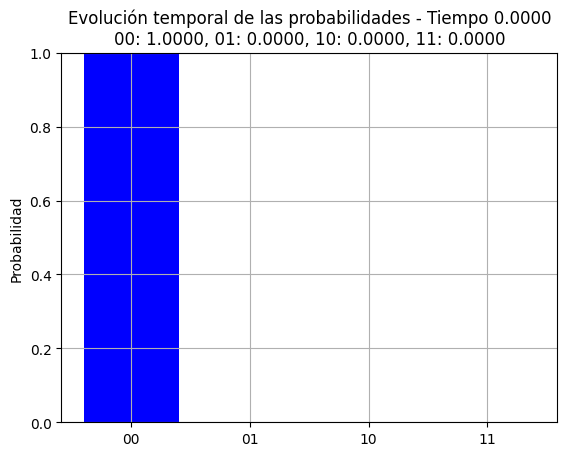

In [7]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Simulación de probabilidades T x 4 (Reemplazar con tus datos reales)
 # Número de instantes de tiempo
probabilidades = prob_data

# Etiquetas para los estados cuánticos
labels = ['00', '01', '10', '11']

# Configuración de la figura y los ejes
fig, ax = plt.subplots()
bars = ax.bar(labels, probabilidades[0], color=['blue', 'orange', 'green', 'red'])

# Configurar el rango de las probabilidades y el título
ax.set_ylim(0, 1)
ax.set_ylabel('Probabilidad')
ax.set_title('Evolución temporal de las probabilidades')
ax.grid(True)

# Función de actualización para la animación
def update(frame):
    for i, bar in enumerate(bars):
        bar.set_height(probabilidades[frame][i])  # Actualizar la altura de cada barra
        bar.set_label(f'{probabilidades[frame][i]:.4f}')  # Mostrar 4 decimales
    ax.set_title(f'Evolución temporal de las probabilidades - Tiempo {frame * dt:.4f}\n' + 
                 f"00: {probabilidades[frame][0]:.4f}, 01: {probabilidades[frame][1]:.4f}, " +
                 f"10: {probabilidades[frame][2]:.4f}, 11: {probabilidades[frame][3]:.4f}")
    return bars

# Crear la animación
ani = FuncAnimation(fig, update, frames=range(N_trotter_Steps), blit=False, repeat=True)

# Mostrar la animación en Jupyter Notebook
HTML(ani.to_jshtml())

And as we can appreciate, the system oscillates between the states $|00 \rangle$ and $|11 \rangle$!